<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_miniprojects/blob/main/06_plantdoc__git%2C_csv%2C_customparser.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

In [ ]:
from icevision.all import *

In [ ]:
import icevision
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.8.1
torch v 1.8.0+cu101
torchvision v 0.9.0+cu101


In [ ]:
dataset_name = 'plantdoc'

# go to github, code button, clone using https
!git clone https://github.com/pratikkayal/PlantDoc-Object-Detection-Dataset.git

fatal: destination path 'PlantDoc-Object-Detection-Dataset' already exists and is not an empty directory.


In [ ]:
!ls

'=5.1'	 install_colab.sh   PlantDoc-Object-Detection-Dataset   sample_data


In [ ]:
%cd PlantDoc-Object-Detection-Dataset/
# running the %cd before this one will not recognize the directory
# expect /content/Plant.../Plant...

/content/PlantDoc-Object-Detection-Dataset


In [ ]:
!ls

'=5.1'		    LICENSE.txt   test_labels.csv   train_labels.csv
 install_colab.sh   TEST	  TRAIN


In [ ]:
import pandas as pd

train_labels = pd.read_csv('train_labels.csv')
train_labels.rename(columns={'class':'label'}, inplace=True)
train_labels.head()

,filename,width,height,label,xmin,ymin,xmax,ymax
0,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,198,77,299,252
1,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,3,114,148,235
2,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,30,184,189,297
3,cherry-tree-leaves-and-fruits.jpg,350,300,Cherry leaf,226,4,346,83
4,peach-and-leaf-stock-image-2809275.jpg,1300,1099,Peach leaf,237,479,527,810


In [ ]:
train_labels.info()
# 8,469 images, no missing val

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8469 entries, 0 to 8468
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  8469 non-null   object
 1   width     8469 non-null   int64 
 2   height    8469 non-null   int64 
 3   label     8469 non-null   object
 4   xmin      8469 non-null   int64 
 5   ymin      8469 non-null   int64 
 6   xmax      8469 non-null   int64 
 7   ymax      8469 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 529.4+ KB


In [ ]:
train_labels.filename.nunique()
# paper: 2,598 data points

2345

In [ ]:
train_labels.label.nunique()
# paper: 13 plant species, 17 classes of diseases

29

In [ ]:
_CLASSES = train_labels.label.unique().tolist()
_CLASSES

['Cherry leaf',
 'Peach leaf',
 'Corn leaf blight',
 'Apple rust leaf',
 'Potato leaf late blight',
 'Strawberry leaf',
 'Corn rust leaf',
 'Tomato leaf late blight',
 'Tomato mold leaf',
 'Potato leaf early blight',
 'Apple leaf',
 'Tomato leaf yellow virus',
 'Blueberry leaf',
 'Tomato leaf mosaic virus',
 'Raspberry leaf',
 'Tomato leaf bacterial spot',
 'Squash Powdery mildew leaf',
 'grape leaf',
 'Corn Gray leaf spot',
 'Tomato Early blight leaf',
 'Apple Scab Leaf',
 'Tomato Septoria leaf spot',
 'Tomato leaf',
 'Soyabean leaf',
 'Bell_pepper leaf spot',
 'Bell_pepper leaf',
 'grape leaf black rot',
 'Potato leaf',
 'Tomato two spotted spider mites leaf']

In [ ]:
class_map = ClassMap(_CLASSES)

In [ ]:
class_map.get_by_name('Apple leaf')
# code to be used in custom parser

11

In [ ]:
!ls

'=5.1'		    LICENSE.txt   test_labels.csv   train_labels.csv
 install_colab.sh   TEST	  TRAIN


In [ ]:
# using VOC format, jpg and xml in one folder
data_dir = Path('./TRAIN')
data_dir.ls()
# contains jpg and xml annotations

(#4720) [Path('TRAIN/ed00fa5f-60af-4767-b8e8-f5405fd6eb44.xml'),Path('TRAIN/soybean-plant-seedling.jpg'),Path('TRAIN/fi000294.jpg'),Path('TRAIN/gcp_A-2_Late_Blight_of_potatoes_callout1.xml'),Path('TRAIN/CRABAPPLE2_leaves.jpg'),Path('TRAIN/img_8042.xml'),Path('TRAIN/Blackberry-black-raspberry3-1024x665.xml'),Path('TRAIN/tomato-leaf-6291945.jpg'),Path('TRAIN/southern-rust-close.xml'),Path('TRAIN/stock-photo-leaf-blueberry-57690040.jpg')...]

In [ ]:
template_record = ObjectDetectionRecord()

In [ ]:
class PlantParser(Parser):
  def __init__(self, template_record, data_dir):
    super().__init__(template_record = template_record)

    self.data_dir = data_dir # data_dir = Path('./TRAIN')
    self.df = train_labels # train_labels = pd.read_csv('train_labels.csv')
    self.class_map = ClassMap(list(self.df['label'].unique()))

  def __iter__(self) -> Any:
    for o in self.df.itertuples():
      yield o

  def __len__(self) -> int:
    return len(self.df)

  def record_id(self, o) -> Hashable:
    return o.filename

  def parse_fields(self, o, record, is_new):
    if is_new:
      record.set_filepath(self.data_dir / o.filename)#
      record.set_img_size(ImgSize(width = o.width, height = o.height))
      record.detection.set_class_map(self.class_map)

    record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
    record.detection.add_labels([o.label])

In [ ]:
# with 'images' removed in filepath
parser = PlantParser(template_record, data_dir)

train_records, valid_records = parser.parse()

  0%|          | 0/8469 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/1876 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 479) - Clipping bbox ymax from 479 to image height 332 (Before: <BBox (xmin:3, ymin:1, xmax:472, ymax:479)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 479) - Clipping bbox xmax from 640 to image width 598 (Before: <BBox (xmin:411, ymin:1, xmax:640, ymax:238)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 32) - Clipping bbox xmax from 525 to image width 0 (Before: <BBox (xmin:58, ymin:92, xmax:525, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 32) - Clipping bbox ymax from 386 to image height 0 (Before: <BBox (xmin:58, ymin:92, xmax:0, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 32) - Cannot auto-fix coordinates: <BBox (xmin:58, ymin:92, xmax:0, ymax:0)>
	x_min:58 is greater than or equal to x_max:0
	y_min:92 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (reco

  0%|          | 0/469 [00:00<?, ?it/s]

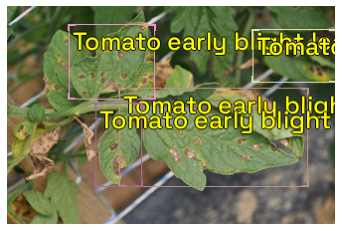

In [ ]:
show_record(train_records[0], class_map=class_map, font_size=25,
            label_color = '#ffff00')

In [ ]:
train_records[0]

BaseRecord

common: 
	- Filepath: TRAIN/12July_mwnews_3-C.jpg
	- Img: None
	- Image size ImgSize(width=330, height=219)
	- Record ID: 1529
detection: 
	- BBoxes: [<BBox (xmin:62, ymin:18, xmax:148, ymax:93)>, <BBox (xmin:113, ymin:82, xmax:302, ymax:181)>, <BBox (xmin:89, ymin:97, xmax:135, ymax:181)>, <BBox (xmin:247, ymin:23, xmax:330, ymax:76)>]
	- Class Map: <ClassMap: {'background': 0, 'Cherry leaf': 1, 'Peach leaf': 2, 'Corn leaf blight': 3, 'Apple rust leaf': 4, 'Potato leaf late blight': 5, 'Strawberry leaf': 6, 'Corn rust leaf': 7, 'Tomato leaf late blight': 8, 'Tomato mold leaf': 9, 'Potato leaf early blight': 10, 'Apple leaf': 11, 'Tomato leaf yellow virus': 12, 'Blueberry leaf': 13, 'Tomato leaf mosaic virus': 14, 'Raspberry leaf': 15, 'Tomato leaf bacterial spot': 16, 'Squash Powdery mildew leaf': 17, 'grape leaf': 18, 'Corn Gray leaf spot': 19, 'Tomato Early blight leaf': 20, 'Apple Scab Leaf': 21, 'Tomato Septoria leaf spot': 22, 'Tomato leaf': 23, 'Soyabean leaf': 24, '

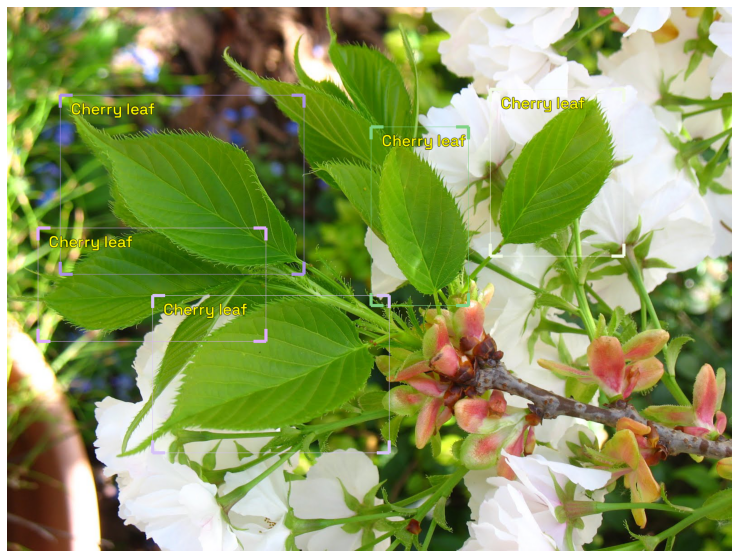

In [ ]:
show_record(train_records[1], class_map=class_map, font_size=35,
            label_color = '#ffff00',
            figsize=(14,10))

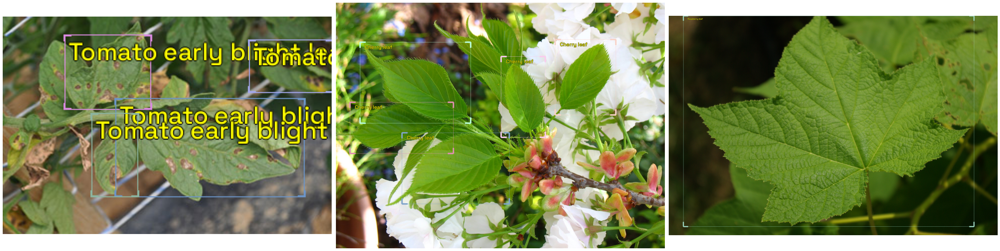

In [ ]:
show_records(train_records[:3], ncols =3, class_map=class_map,
              font_size=25,
            label_color = '#ffff00')

In [ ]:
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

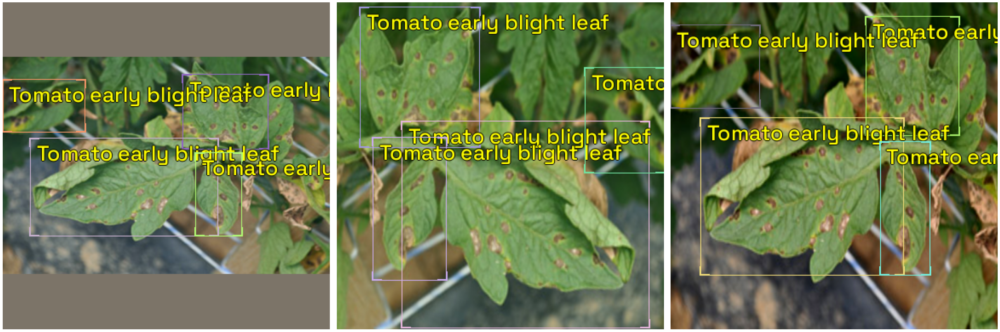

In [ ]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#ffff00')
# https://github.com/yrodriguezmd/icevision/blob/master/icevision/visualize/show_data.py

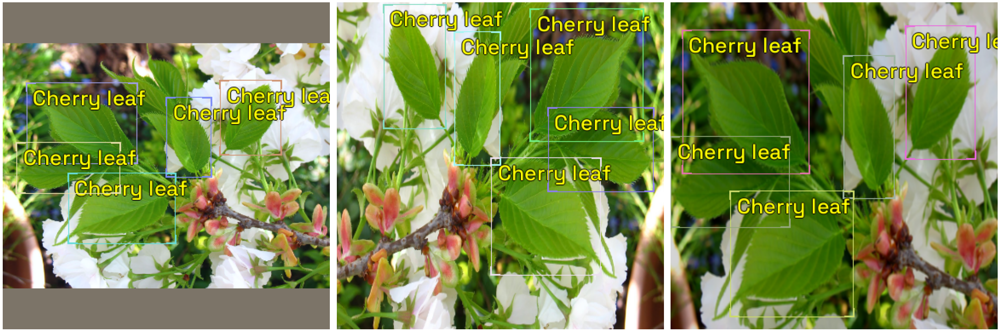

In [ ]:
samples = [train_ds[1] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#ffff00')

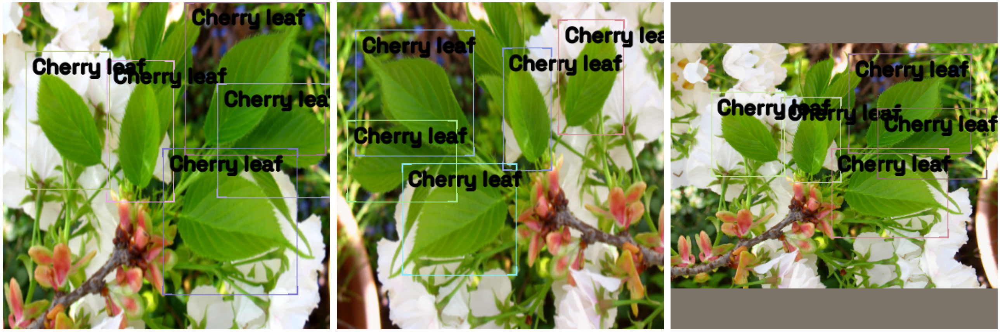

In [ ]:
samples = [train_ds[1] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#000000')